# 03B — Seed-Sensitivity Evaluation

This notebook is derived from the definitive Seed-42 evaluation notebook.

Set `RUN_SEED` to the run being evaluated (`1` or `2`). It loads that run's
trained model, threshold-selection outputs, and test-result CSVs from
run-specific folders.

For the reviewer sensitivity analysis, the essential outputs are:
- training logs,
- validation-selected threshold,
- positive-test per-slice metrics, and
- positive-test summary.

The full qualitative manuscript figures may be skipped for Seeds 1 and 2 unless
you want them for diagnostic purposes.


In [1]:
# ============================================================
# SECTION 1 — Imports and reproducibility
# ============================================================

import os
import json
import random
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

COHORT_SEED = 42      # permanently frozen study cohort
RUN_SEED = 1          # set to 1 or 2
SEED = RUN_SEED

os.environ["PYTHONHASHSEED"] = str(SEED)

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

print("TensorFlow:", tf.__version__)
print("Cohort seed:", COHORT_SEED)
print("Run seed:", RUN_SEED)


TensorFlow: 2.21.0
Seed: 42


In [2]:
# ============================================================
# SECTION 2 — Project paths
# ============================================================

PROJECT_ROOT = Path(
    "/Volumes/Expansion/PLOS_2D_UNet_Revision"
)

PROCESSED_DIR = PROJECT_ROOT / "processed"
METADATA_DIR = PROJECT_ROOT / "metadata"
SPLITS_DIR = PROJECT_ROOT / "splits"
RESULTS_DIR = PROJECT_ROOT / "results"
FIGURES_DIR = PROJECT_ROOT / "figures"
MODELS_DIR = PROJECT_ROOT / "models"

for directory in [
    PROCESSED_DIR,
    METADATA_DIR,
    SPLITS_DIR,
    RESULTS_DIR,
    FIGURES_DIR,
    MODELS_DIR,
]:
    if not directory.exists():
        raise FileNotFoundError(
            f"Directory does not exist: {directory}"
        )

print("Project root:", PROJECT_ROOT)
print("Results directory:", RESULTS_DIR)
print("Figures directory:", FIGURES_DIR)
print("Evaluating run seed:", RUN_SEED)
print("Run results:", RESULTS_DIR)
print("Run models:", MODELS_DIR)


Project root: /Volumes/Expansion/PLOS_2D_UNet_Revision
Results directory: /Volumes/Expansion/PLOS_2D_UNet_Revision/results
Figures directory: /Volumes/Expansion/PLOS_2D_UNet_Revision/figures


In [3]:
# ============================================================
# SECTION 3 — Load model configuration
# ============================================================

architecture_config_path = (
    RESULTS_DIR /
    "unet_architecture_config.json"
)

training_config_path = (
    RESULTS_DIR /
    "unet_training_config.json"
)

with open(
    architecture_config_path,
    "r",
    encoding="utf-8",
) as file:
    architecture_config = json.load(file)

with open(
    training_config_path,
    "r",
    encoding="utf-8",
) as file:
    training_config = json.load(file)

print("Architecture configuration:")
print(json.dumps(
    architecture_config,
    indent=2,
))

print("\nTraining configuration:")
print(json.dumps(
    training_config,
    indent=2,
))


Architecture configuration:
{
  "input_shape": [
    256,
    256,
    1
  ],
  "base_filters": 32,
  "depth": 4,
  "dropout_encoder": 0.1,
  "dropout_bottleneck": 0.3,
  "batch_normalization": true,
  "kernel_initializer": "he_normal",
  "output_channels": 1,
  "output_activation": "sigmoid"
}

Training configuration:
{
  "seed": 42,
  "model_name": "PLOS_2D_UNet",
  "input_shape": [
    256,
    256,
    1
  ],
  "batch_size": 8,
  "balanced_training": true,
  "training_positive_fraction": 0.5,
  "training_steps_per_epoch": 400,
  "augmentation": "none",
  "optimizer": "Adam",
  "initial_learning_rate": 0.0001,
  "loss": "0.5_binary_crossentropy_plus_0.5_dice_loss",
  "maximum_epochs": 50,
  "early_stopping_patience": 7,
  "reduce_lr_patience": 3,
  "prediction_threshold": 0.5,
  "model_checkpoint_monitor": "val_thresholded_dice",
  "validation_distribution": "natural",
  "test_distribution": "natural"
}


In [4]:
# ============================================================
# SECTION 4 — Custom loss and metrics
# ============================================================

SMOOTH = 1e-6
PREDICTION_THRESHOLD = 0.50


def dice_coefficient(
    y_true,
    y_pred,
    smooth=SMOOTH,
):
    y_true = tf.cast(
        y_true,
        tf.float32,
    )

    y_pred = tf.cast(
        y_pred,
        tf.float32,
    )

    axes = (1, 2, 3)

    intersection = tf.reduce_sum(
        y_true * y_pred,
        axis=axes,
    )

    denominator = (
        tf.reduce_sum(
            y_true,
            axis=axes,
        )
        +
        tf.reduce_sum(
            y_pred,
            axis=axes,
        )
    )

    dice_per_sample = (
        2.0 * intersection + smooth
    ) / (
        denominator + smooth
    )

    return tf.reduce_mean(
        dice_per_sample
    )


def foreground_dice(
    y_true,
    y_pred,
    smooth=SMOOTH,
):
    y_true = tf.cast(
        y_true >= 0.5,
        tf.float32,
    )

    y_pred = tf.cast(
        y_pred >= PREDICTION_THRESHOLD,
        tf.float32,
    )

    axes = (1, 2, 3)

    true_area = tf.reduce_sum(
        y_true,
        axis=axes,
    )

    predicted_area = tf.reduce_sum(
        y_pred,
        axis=axes,
    )

    intersection = tf.reduce_sum(
        y_true * y_pred,
        axis=axes,
    )

    dice_per_sample = (
        2.0 * intersection + smooth
    ) / (
        true_area
        + predicted_area
        + smooth
    )

    positive_samples = (
        true_area > 0
    )

    positive_values = tf.boolean_mask(
        dice_per_sample,
        positive_samples,
    )

    return tf.cond(
        tf.size(positive_values) > 0,
        lambda: tf.reduce_mean(
            positive_values
        ),
        lambda: tf.constant(
            0.0,
            dtype=tf.float32,
        ),
    )


def intersection_over_union(
    y_true,
    y_pred,
    smooth=SMOOTH,
):
    y_true = tf.cast(
        y_true >= 0.5,
        tf.float32,
    )

    y_pred = tf.cast(
        y_pred >= PREDICTION_THRESHOLD,
        tf.float32,
    )

    axes = (1, 2, 3)

    intersection = tf.reduce_sum(
        y_true * y_pred,
        axis=axes,
    )

    union = (
        tf.reduce_sum(
            y_true,
            axis=axes,
        )
        +
        tf.reduce_sum(
            y_pred,
            axis=axes,
        )
        -
        intersection
    )

    iou_per_sample = (
        intersection + smooth
    ) / (
        union + smooth
    )

    return tf.reduce_mean(
        iou_per_sample
    )


def segmentation_precision(
    y_true,
    y_pred,
    smooth=SMOOTH,
):
    y_true = tf.cast(
        y_true >= 0.5,
        tf.float32,
    )

    y_pred = tf.cast(
        y_pred >= PREDICTION_THRESHOLD,
        tf.float32,
    )

    axes = (1, 2, 3)

    true_positive = tf.reduce_sum(
        y_true * y_pred,
        axis=axes,
    )

    false_positive = tf.reduce_sum(
        (1.0 - y_true) * y_pred,
        axis=axes,
    )

    precision = (
        true_positive + smooth
    ) / (
        true_positive
        + false_positive
        + smooth
    )

    return tf.reduce_mean(
        precision
    )


def segmentation_recall(
    y_true,
    y_pred,
    smooth=SMOOTH,
):
    y_true = tf.cast(
        y_true >= 0.5,
        tf.float32,
    )

    y_pred = tf.cast(
        y_pred >= PREDICTION_THRESHOLD,
        tf.float32,
    )

    axes = (1, 2, 3)

    true_positive = tf.reduce_sum(
        y_true * y_pred,
        axis=axes,
    )

    false_negative = tf.reduce_sum(
        y_true * (1.0 - y_pred),
        axis=axes,
    )

    recall = (
        true_positive + smooth
    ) / (
        true_positive
        + false_negative
        + smooth
    )

    return tf.reduce_mean(
        recall
    )


def segmentation_specificity(
    y_true,
    y_pred,
    smooth=SMOOTH,
):
    y_true = tf.cast(
        y_true >= 0.5,
        tf.float32,
    )

    y_pred = tf.cast(
        y_pred >= PREDICTION_THRESHOLD,
        tf.float32,
    )

    axes = (1, 2, 3)

    true_negative = tf.reduce_sum(
        (1.0 - y_true)
        *
        (1.0 - y_pred),
        axis=axes,
    )

    false_positive = tf.reduce_sum(
        (1.0 - y_true)
        *
        y_pred,
        axis=axes,
    )

    specificity = (
        true_negative + smooth
    ) / (
        true_negative
        + false_positive
        + smooth
    )

    return tf.reduce_mean(
        specificity
    )


def tversky_index(
    y_true,
    y_pred,
    alpha=0.30,
    beta=0.70,
    smooth=SMOOTH,
):
    y_true = tf.cast(
        y_true,
        tf.float32,
    )

    y_pred = tf.cast(
        y_pred,
        tf.float32,
    )

    axes = (1, 2, 3)

    true_positive = tf.reduce_sum(
        y_true * y_pred,
        axis=axes,
    )

    false_positive = tf.reduce_sum(
        (1.0 - y_true) * y_pred,
        axis=axes,
    )

    false_negative = tf.reduce_sum(
        y_true * (1.0 - y_pred),
        axis=axes,
    )

    score = (
        true_positive + smooth
    ) / (
        true_positive
        + alpha * false_positive
        + beta * false_negative
        + smooth
    )

    return tf.reduce_mean(score)


def focal_tversky_loss(
    y_true,
    y_pred,
    alpha=0.30,
    beta=0.70,
    gamma=0.75,
):
    score = tversky_index(
        y_true,
        y_pred,
        alpha=alpha,
        beta=beta,
    )

    return tf.pow(
        1.0 - score,
        gamma,
    )


In [5]:
# ============================================================
# SECTION 5 — Load definitive U-Net model
# ============================================================

BEST_MODEL_V2_PATH = (
    MODELS_DIR /
    "best_plos_2d_unet_focal_tversky.keras"
)

if not BEST_MODEL_V2_PATH.exists():
    raise FileNotFoundError(
        f"Model not found: {BEST_MODEL_V2_PATH}"
    )

custom_objects_v2 = {
    "focal_tversky_loss": focal_tversky_loss,
    "tversky_index": tversky_index,
    "dice_coefficient": dice_coefficient,
    "foreground_dice": foreground_dice,
    "intersection_over_union": intersection_over_union,
    "segmentation_precision": segmentation_precision,
    "segmentation_recall": segmentation_recall,
    "segmentation_specificity": segmentation_specificity,
}

best_model_v2 = tf.keras.models.load_model(
    BEST_MODEL_V2_PATH,
    custom_objects=custom_objects_v2,
)

print("Model loaded from:")
print(BEST_MODEL_V2_PATH)

print("\nModel input shape:")
print(best_model_v2.input_shape)

print("\nModel output shape:")
print(best_model_v2.output_shape)

print("\nTotal parameters:")
print(f"{best_model_v2.count_params():,}")


Model loaded from:
/Volumes/Expansion/PLOS_2D_UNet_Revision/models/best_plos_2d_unet_focal_tversky.keras

Model input shape:
(None, 256, 256, 1)

Model output shape:
(None, 256, 256, 1)

Total parameters:
7,768,353


In [6]:
# ============================================================
# SECTION 6 — Load selected prediction threshold
# ============================================================

threshold_config_path = (
    RESULTS_DIR /
    "selected_prediction_threshold.json"
)

with open(
    threshold_config_path,
    "r",
    encoding="utf-8",
) as file:
    threshold_config = json.load(file)

OPTIMAL_THRESHOLD = float(
    threshold_config["selected_threshold"]
)

print("Threshold selection dataset:")
print(
    threshold_config[
        "selection_dataset"
    ]
)

print("\nThreshold selection metric:")
print(
    threshold_config[
        "selection_metric"
    ]
)

print("\nFrozen prediction threshold:")
print(OPTIMAL_THRESHOLD)

assert np.isclose(
    OPTIMAL_THRESHOLD,
    0.05,
)


Threshold selection dataset:
positive validation slices only

Threshold selection metric:
mean per-slice Dice

Frozen prediction threshold:
0.05


In [7]:
# ============================================================
# SECTION 7 — Inspect training logs
# ============================================================

training_log_files = sorted(
    RESULTS_DIR.glob(
        "*training*log*.csv"
    )
)

print("Training log files found:")

for path in training_log_files:
    print("-", path.name)


Training log files found:
- unet_focal_tversky_full_training_log.csv
- unet_focal_tversky_training_log.csv
- unet_training_log.csv


In [8]:
FULL_LOG_V2_PATH = (
    RESULTS_DIR /
    "unet_focal_tversky_full_training_log.csv"
)

if not FULL_LOG_V2_PATH.exists():
    raise FileNotFoundError(
        f"Training log not found: {FULL_LOG_V2_PATH}"
    )

full_training_log_df = pd.read_csv(
    FULL_LOG_V2_PATH
)

print(
    "Continuation epochs:",
    len(full_training_log_df),
)

full_training_log_df.head()


Continuation epochs: 14


,epoch,dice_coefficient,foreground_dice,intersection_over_union,learning_rate,loss,segmentation_precision,segmentation_recall,segmentation_specificity,val_dice_coefficient,val_foreground_dice,val_intersection_over_union,val_loss,val_segmentation_precision,val_segmentation_recall,val_segmentation_specificity
0,5,0.328531,0.506255,0.405657,0.0001,0.707769,0.508557,0.749740,0.999689,0.353535,0.387132,0.311594,0.696622,0.676424,0.417243,0.999784
1,6,0.370760,0.535926,0.436111,0.0001,0.677112,0.551408,0.754551,0.999781,0.359910,0.381902,0.300378,0.691968,0.539842,0.436186,0.999744
2,7,0.400367,0.560129,0.443482,0.0001,0.652860,0.536264,0.780933,0.999774,0.344317,0.356629,0.287295,0.713880,0.648723,0.371569,0.999863
3,8,0.428504,0.591491,0.494192,0.0001,0.631874,0.601063,0.788238,0.999808,0.383995,0.391416,0.315031,0.675475,0.612780,0.426910,0.999800
4,9,0.431080,0.588552,0.479876,0.0001,0.629966,0.580839,0.791501,0.999802,0.367799,0.370810,0.301060,0.697737,0.674128,0.377173,0.999839


In [9]:
print(
    full_training_log_df[
        ["epoch"]
    ].head()
)

print(
    full_training_log_df[
        ["epoch"]
    ].tail()
)


   epoch
0      5
1      6
2      7
3      8
4      9
    epoch
9      14
10     15
11     16
12     17
13     18


In [10]:
# ============================================================
# SECTION 8 — Load threshold and test results
# ============================================================

threshold_summary_path = (
    RESULTS_DIR /
    "validation_threshold_summary.csv"
)

threshold_details_path = (
    RESULTS_DIR /
    "validation_threshold_slice_metrics.csv"
)

positive_test_metrics_path = (
    RESULTS_DIR /
    "positive_test_per_slice_metrics.csv"
)

positive_test_summary_path = (
    RESULTS_DIR /
    "positive_test_summary.csv"
)

required_files = [
    threshold_summary_path,
    threshold_details_path,
    positive_test_metrics_path,
    positive_test_summary_path,
]

for path in required_files:
    if not path.exists():
        raise FileNotFoundError(
            f"Required evaluation file missing: {path}"
        )

threshold_summary_df = pd.read_csv(
    threshold_summary_path
)

validation_threshold_details_df = pd.read_csv(
    threshold_details_path
)

positive_test_metrics_df = pd.read_csv(
    positive_test_metrics_path
)

positive_test_summary_df = pd.read_csv(
    positive_test_summary_path
)

print(
    "Thresholds evaluated:",
    len(threshold_summary_df),
)

print(
    "Positive test slices:",
    len(positive_test_metrics_df),
)

positive_test_summary_df


Thresholds evaluated: 18
Positive test slices: 1142


,threshold,n_positive_test_slices,mean_dice,median_dice,mean_iou,mean_precision,mean_recall,mean_specificity,detected_slices,detection_rate
0,0.05,1142,0.440241,0.5,0.34741,0.433817,0.54702,0.999792,822,0.71979


In [11]:
# ============================================================
# SECTION 9 — Evaluation reproducibility audit
# ============================================================

required_test_columns = {
    "slice_index",
    "threshold",
    "dice",
    "iou",
    "precision",
    "recall",
    "specificity",
    "ground_truth_pixels",
    "predicted_pixels",
    "true_positive_pixels",
    "false_positive_pixels",
    "false_negative_pixels",
    "detected",
}

missing_columns = (
    required_test_columns
    -
    set(positive_test_metrics_df.columns)
)

if missing_columns:
    raise ValueError(
        "Missing test-metric columns: "
        f"{sorted(missing_columns)}"
    )

assert len(
    positive_test_metrics_df
) == 1142

assert np.allclose(
    positive_test_metrics_df[
        "threshold"
    ],
    OPTIMAL_THRESHOLD,
)

assert positive_test_metrics_df[
    "ground_truth_pixels"
].gt(0).all()

assert positive_test_metrics_df[
    "dice"
].between(0, 1).all()

assert positive_test_metrics_df[
    "iou"
].between(0, 1).all()

print("Evaluation-data audit: PASSED")


Evaluation-data audit: PASSED


In [12]:
# ============================================================
# SECTION 10 — Authoritative positive-test results
# ============================================================

final_summary = (
    positive_test_summary_df
    .iloc[0]
    .to_dict()
)

print(
    "=== DEFINITIVE POSITIVE-TEST RESULTS ==="
)

for name, value in final_summary.items():

    if isinstance(
        value,
        (float, np.floating),
    ):
        print(
            f"{name}: {value:.6f}"
        )

    else:
        print(
            f"{name}: {value}"
        )


=== DEFINITIVE POSITIVE-TEST RESULTS ===
threshold: 0.050000
n_positive_test_slices: 1142.000000
mean_dice: 0.440241
median_dice: 0.500000
mean_iou: 0.347410
mean_precision: 0.433817
mean_recall: 0.547020
mean_specificity: 0.999792
detected_slices: 822.000000
detection_rate: 0.719790


In [13]:
# ============================================================
# Clean final-result display
# ============================================================

integer_fields = {
    "n_positive_test_slices",
    "detected_slices",
}

print("=== DEFINITIVE POSITIVE-TEST RESULTS ===")

for name, value in final_summary.items():

    if name in integer_fields:
        print(f"{name}: {int(value):,}")

    elif isinstance(value, (float, np.floating)):
        print(f"{name}: {value:.6f}")

    else:
        print(f"{name}: {value}")


=== DEFINITIVE POSITIVE-TEST RESULTS ===
threshold: 0.050000
n_positive_test_slices: 1,142
mean_dice: 0.440241
median_dice: 0.500000
mean_iou: 0.347410
mean_precision: 0.433817
mean_recall: 0.547020
mean_specificity: 0.999792
detected_slices: 822
detection_rate: 0.719790


In [14]:
# ============================================================
# SECTION 11 — Locate pilot and continuation logs
# ============================================================

csv_files = sorted(RESULTS_DIR.glob("*.csv"))

for path in csv_files:
    if "training" in path.name.lower():
        print(path.name)


unet_focal_tversky_full_training_log.csv
unet_focal_tversky_training_log.csv
unet_training_history_initial_run.csv
unet_training_log.csv


In [15]:
PILOT_LOG_PATH = (
    RESULTS_DIR /
    "unet_focal_tversky_training_log.csv"
)

FULL_LOG_PATH = (
    RESULTS_DIR /
    "unet_focal_tversky_full_training_log.csv"
)

for path in [PILOT_LOG_PATH, FULL_LOG_PATH]:
    if not path.exists():
        raise FileNotFoundError(
            f"Training log not found: {path}"
        )

pilot_log_df = pd.read_csv(PILOT_LOG_PATH)
full_log_df = pd.read_csv(FULL_LOG_PATH)

print("Pilot rows:", len(pilot_log_df))
print("Continuation rows:", len(full_log_df))

print("\nPilot columns:")
print(pilot_log_df.columns.tolist())

print("\nContinuation columns:")
print(full_log_df.columns.tolist())


Pilot rows: 5
Continuation rows: 14

Pilot columns:
['epoch', 'dice_coefficient', 'foreground_dice', 'intersection_over_union', 'learning_rate', 'loss', 'segmentation_precision', 'segmentation_recall', 'segmentation_specificity', 'val_dice_coefficient', 'val_foreground_dice', 'val_intersection_over_union', 'val_loss', 'val_segmentation_precision', 'val_segmentation_recall', 'val_segmentation_specificity']

Continuation columns:
['epoch', 'dice_coefficient', 'foreground_dice', 'intersection_over_union', 'learning_rate', 'loss', 'segmentation_precision', 'segmentation_recall', 'segmentation_specificity', 'val_dice_coefficient', 'val_foreground_dice', 'val_intersection_over_union', 'val_loss', 'val_segmentation_precision', 'val_segmentation_recall', 'val_segmentation_specificity']


In [16]:
# ============================================================
# SECTION 12 — Combine complete training history
# ============================================================

pilot_history_df = pilot_log_df.copy()
continuation_history_df = full_log_df.copy()

# Pilot corresponds to epochs 1–5
pilot_history_df["training_epoch"] = np.arange(
    1,
    len(pilot_history_df) + 1,
)

# Continuation began with initial_epoch=5,
# therefore its first completed epoch is epoch 6
continuation_history_df["training_epoch"] = np.arange(
    6,
    6 + len(continuation_history_df),
)

pilot_history_df["training_stage"] = "Pilot"
continuation_history_df["training_stage"] = "Continuation"

common_columns = [
    column
    for column in pilot_history_df.columns
    if column in continuation_history_df.columns
]

complete_history_df = pd.concat(
    [
        pilot_history_df[common_columns],
        continuation_history_df[common_columns],
    ],
    ignore_index=True,
)

complete_history_df = complete_history_df.sort_values(
    "training_epoch"
).reset_index(drop=True)

print("Total completed epochs:", len(complete_history_df))
print(
    "Epoch range:",
    complete_history_df["training_epoch"].min(),
    "to",
    complete_history_df["training_epoch"].max(),
)

complete_history_df[
    [
        "training_epoch",
        "training_stage",
        "foreground_dice",
        "val_foreground_dice",
        "loss",
        "val_loss",
    ]
].head(10)


Total completed epochs: 19
Epoch range: 1 to 19


,training_epoch,training_stage,foreground_dice,val_foreground_dice,loss,val_loss
0,1,Pilot,0.034846,0.101579,0.992997,0.984010
1,2,Pilot,0.134689,0.183962,0.975178,0.933406
2,3,Pilot,0.265368,0.299798,0.928358,0.888986
3,4,Pilot,0.375871,0.308547,0.845882,0.822151
4,5,Pilot,0.451152,0.377940,0.765643,0.727130
5,6,Continuation,0.506255,0.387132,0.707769,0.696622
6,7,Continuation,0.535926,0.381902,0.677112,0.691968
7,8,Continuation,0.560129,0.356629,0.652860,0.713880
8,9,Continuation,0.591491,0.391416,0.631874,0.675475
9,10,Continuation,0.588552,0.370810,0.629966,0.697737


In [17]:
# ============================================================
# SECTION 13 — Identify best validation epoch
# ============================================================

best_epoch_row = complete_history_df.loc[
    complete_history_df[
        "val_foreground_dice"
    ].idxmax()
]

BEST_EPOCH = int(
    best_epoch_row["training_epoch"]
)

BEST_VAL_FOREGROUND_DICE = float(
    best_epoch_row["val_foreground_dice"]
)

print("Best epoch:", BEST_EPOCH)
print(
    "Best validation foreground Dice:",
    f"{BEST_VAL_FOREGROUND_DICE:.6f}",
)

assert BEST_EPOCH == 11


Best epoch: 11
Best validation foreground Dice: 0.407874


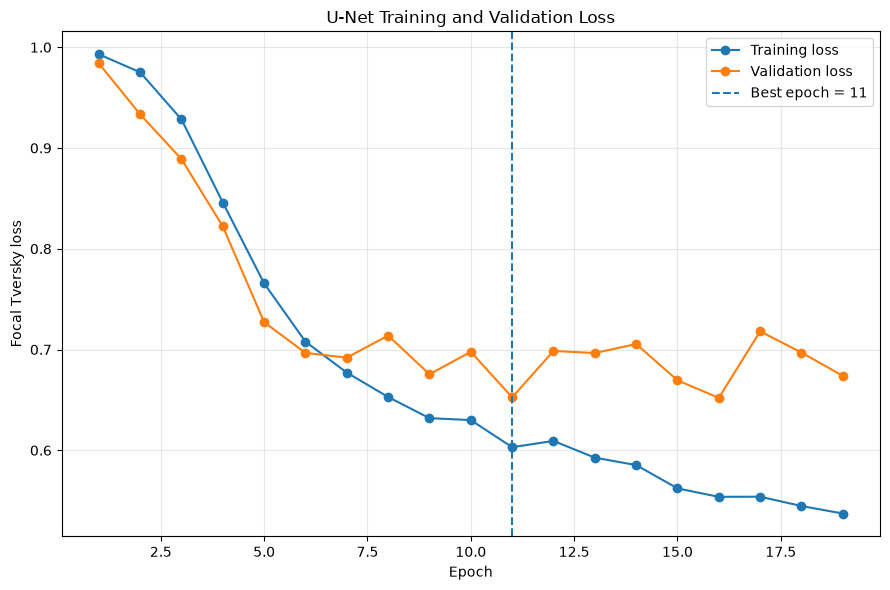

Saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/figures/unet_training_validation_loss.png


In [18]:
# ============================================================
# SECTION 14 — Training and validation loss
# ============================================================

plt.figure(figsize=(9, 6))

plt.plot(
    complete_history_df["training_epoch"],
    complete_history_df["loss"],
    marker="o",
    label="Training loss",
)

plt.plot(
    complete_history_df["training_epoch"],
    complete_history_df["val_loss"],
    marker="o",
    label="Validation loss",
)

plt.axvline(
    BEST_EPOCH,
    linestyle="--",
    label=f"Best epoch = {BEST_EPOCH}",
)

plt.xlabel("Epoch")
plt.ylabel("Focal Tversky loss")
plt.title("U-Net Training and Validation Loss")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()

loss_figure_path = (
    FIGURES_DIR /
    "unet_training_validation_loss.png"
)

plt.savefig(
    loss_figure_path,
    dpi=300,
    bbox_inches="tight",
)

plt.show()

print("Saved to:")
print(loss_figure_path)


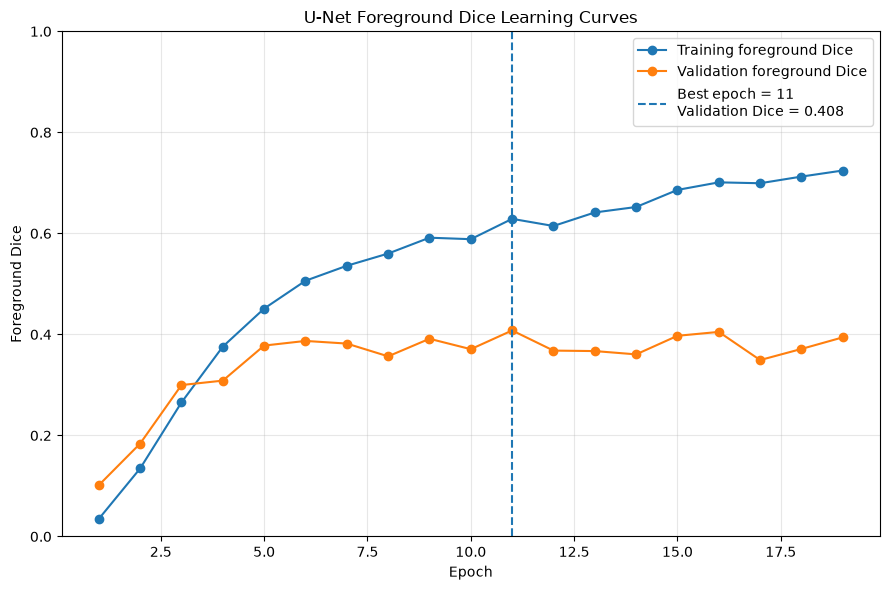

Saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/figures/unet_foreground_dice_learning_curves.png


In [19]:
# ============================================================
# SECTION 15 — Foreground Dice learning curves
# ============================================================

plt.figure(figsize=(9, 6))

plt.plot(
    complete_history_df["training_epoch"],
    complete_history_df["foreground_dice"],
    marker="o",
    label="Training foreground Dice",
)

plt.plot(
    complete_history_df["training_epoch"],
    complete_history_df["val_foreground_dice"],
    marker="o",
    label="Validation foreground Dice",
)

plt.axvline(
    BEST_EPOCH,
    linestyle="--",
    label=(
        f"Best epoch = {BEST_EPOCH}\n"
        f"Validation Dice = "
        f"{BEST_VAL_FOREGROUND_DICE:.3f}"
    ),
)

plt.xlabel("Epoch")
plt.ylabel("Foreground Dice")
plt.title("U-Net Foreground Dice Learning Curves")
plt.ylim(0, 1)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()

dice_figure_path = (
    FIGURES_DIR /
    "unet_foreground_dice_learning_curves.png"
)

plt.savefig(
    dice_figure_path,
    dpi=300,
    bbox_inches="tight",
)

plt.show()

print("Saved to:")
print(dice_figure_path)


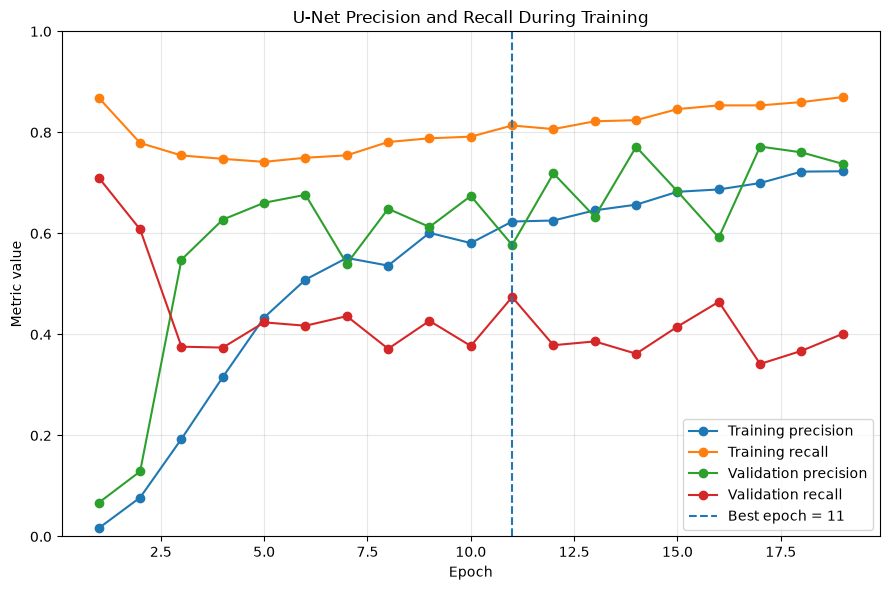

Saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/figures/unet_precision_recall_learning_curves.png


In [20]:
# ============================================================
# SECTION 16 — Precision and recall learning curves
# ============================================================

plt.figure(figsize=(9, 6))

plt.plot(
    complete_history_df["training_epoch"],
    complete_history_df["segmentation_precision"],
    marker="o",
    label="Training precision",
)

plt.plot(
    complete_history_df["training_epoch"],
    complete_history_df["segmentation_recall"],
    marker="o",
    label="Training recall",
)

plt.plot(
    complete_history_df["training_epoch"],
    complete_history_df["val_segmentation_precision"],
    marker="o",
    label="Validation precision",
)

plt.plot(
    complete_history_df["training_epoch"],
    complete_history_df["val_segmentation_recall"],
    marker="o",
    label="Validation recall",
)

plt.axvline(
    BEST_EPOCH,
    linestyle="--",
    label=f"Best epoch = {BEST_EPOCH}",
)

plt.xlabel("Epoch")
plt.ylabel("Metric value")
plt.title("U-Net Precision and Recall During Training")
plt.ylim(0, 1)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()

precision_recall_figure_path = (
    FIGURES_DIR /
    "unet_precision_recall_learning_curves.png"
)

plt.savefig(
    precision_recall_figure_path,
    dpi=300,
    bbox_inches="tight",
)

plt.show()

print("Saved to:")
print(precision_recall_figure_path)


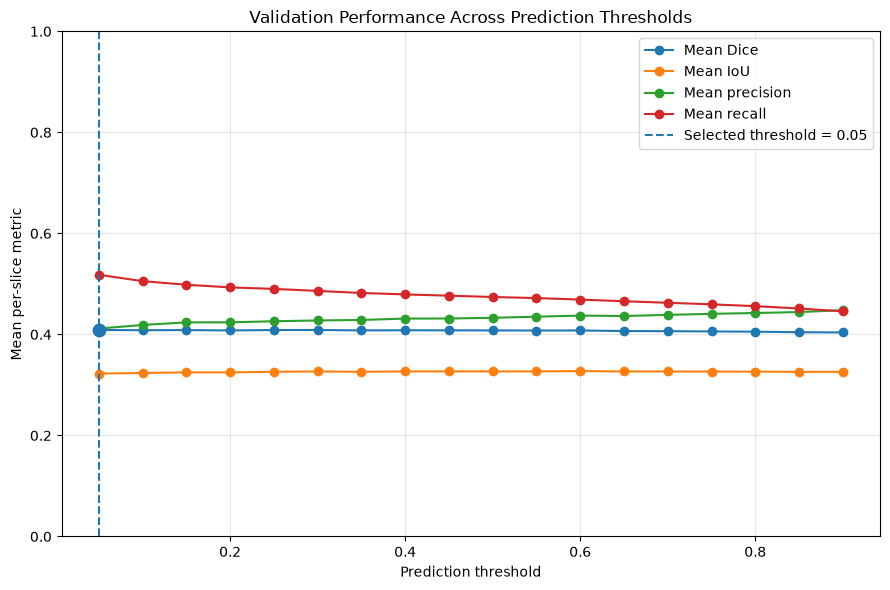

Saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/figures/validation_threshold_optimization_final.png


In [21]:
# ============================================================
# SECTION 17 — Validation threshold optimization
# ============================================================

selected_threshold_row = threshold_summary_df.loc[
    threshold_summary_df["threshold"].sub(
        OPTIMAL_THRESHOLD
    ).abs().idxmin()
]

plt.figure(figsize=(9, 6))

plt.plot(
    threshold_summary_df["threshold"],
    threshold_summary_df["mean_dice"],
    marker="o",
    label="Mean Dice",
)

plt.plot(
    threshold_summary_df["threshold"],
    threshold_summary_df["mean_iou"],
    marker="o",
    label="Mean IoU",
)

plt.plot(
    threshold_summary_df["threshold"],
    threshold_summary_df["mean_precision"],
    marker="o",
    label="Mean precision",
)

plt.plot(
    threshold_summary_df["threshold"],
    threshold_summary_df["mean_recall"],
    marker="o",
    label="Mean recall",
)

plt.axvline(
    OPTIMAL_THRESHOLD,
    linestyle="--",
    label=(
        f"Selected threshold = "
        f"{OPTIMAL_THRESHOLD:.2f}"
    ),
)

plt.scatter(
    [OPTIMAL_THRESHOLD],
    [selected_threshold_row["mean_dice"]],
    s=80,
    zorder=5,
)

plt.xlabel("Prediction threshold")
plt.ylabel("Mean per-slice metric")
plt.title(
    "Validation Performance Across Prediction Thresholds"
)
plt.ylim(0, 1)
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()

threshold_figure_path = (
    FIGURES_DIR /
    "validation_threshold_optimization_final.png"
)

plt.savefig(
    threshold_figure_path,
    dpi=300,
    bbox_inches="tight",
)

plt.show()

print("Saved to:")
print(threshold_figure_path)


In [22]:
# ============================================================
# SECTION 18 — Selected-threshold validation metrics
# ============================================================

selected_threshold_metrics = {
    "threshold": float(
        selected_threshold_row["threshold"]
    ),
    "mean_dice": float(
        selected_threshold_row["mean_dice"]
    ),
    "median_dice": float(
        selected_threshold_row["median_dice"]
    ),
    "mean_iou": float(
        selected_threshold_row["mean_iou"]
    ),
    "mean_precision": float(
        selected_threshold_row["mean_precision"]
    ),
    "mean_recall": float(
        selected_threshold_row["mean_recall"]
    ),
    "mean_specificity": float(
        selected_threshold_row["mean_specificity"]
    ),
    "detection_rate": float(
        selected_threshold_row["detection_rate"]
    ),
}

print(
    "=== VALIDATION METRICS AT SELECTED THRESHOLD ==="
)

for name, value in selected_threshold_metrics.items():
    print(f"{name}: {value:.6f}")


=== VALIDATION METRICS AT SELECTED THRESHOLD ===
threshold: 0.050000
mean_dice: 0.408884
median_dice: 0.417476
mean_iou: 0.322571
mean_precision: 0.411596
mean_recall: 0.518145
mean_specificity: 0.999688
detection_rate: 0.704603


In [24]:
globals().keys()


dict_keys(['__name__', '__doc__', '__package__', '__loader__', '__spec__', '__builtin__', '__builtins__', '_ih', '_oh', '_dh', 'In', 'Out', 'get_ipython', 'exit', 'quit', 'open', '_', '__', '___', '_pydevd_bundle', 'plt', '_i', '_ii', '_iii', '_i1', 'os', 'json', 'random', 'Path', 'np', 'pd', 'tf', 'SEED', 'pydev_jupyter_vars', '_i2', 'PROJECT_ROOT', 'PROCESSED_DIR', 'METADATA_DIR', 'SPLITS_DIR', 'RESULTS_DIR', 'FIGURES_DIR', 'MODELS_DIR', 'directory', '_i3', 'architecture_config_path', 'training_config_path', 'file', 'architecture_config', 'training_config', '_i4', 'SMOOTH', 'PREDICTION_THRESHOLD', 'dice_coefficient', 'foreground_dice', 'intersection_over_union', 'segmentation_precision', 'segmentation_recall', 'segmentation_specificity', 'tversky_index', 'focal_tversky_loss', '_i5', 'BEST_MODEL_V2_PATH', 'custom_objects_v2', 'best_model_v2', '_i6', 'threshold_config_path', 'threshold_config', 'OPTIMAL_THRESHOLD', '_i7', 'training_log_files', 'path', '_i8', 'FULL_LOG_V2_PATH', 'full_t

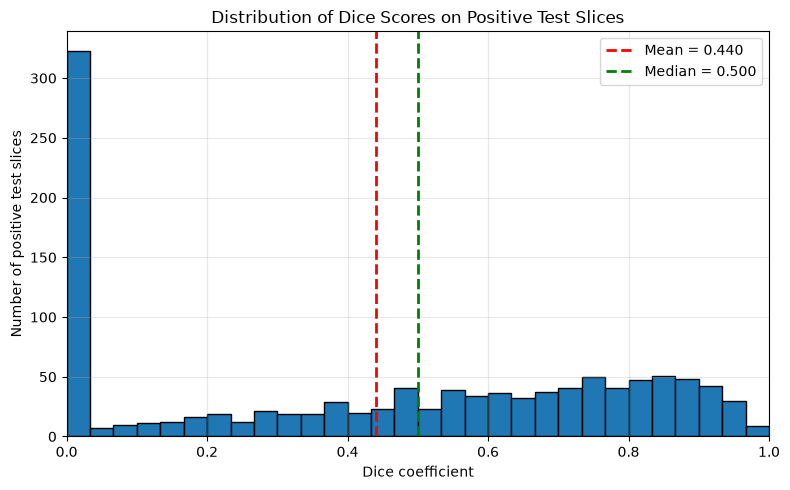

Mean Dice: 0.440241
Median Dice: 0.500000
Saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/figures/dice_distribution_positive_test.png


In [27]:
# ============================================================
# SECTION 19 — Dice-score distribution
# ============================================================

dice_values = positive_test_metrics_df["dice"]

dice_mean = dice_values.mean()
dice_median = dice_values.median()

plt.figure(figsize=(8, 5))

plt.hist(
    dice_values,
    bins=30,
    edgecolor="black",
)

plt.axvline(
    dice_mean,
    color="red",
    linestyle="--",
    linewidth=2,
    label=f"Mean = {dice_mean:.3f}"
)

plt.axvline(
    dice_median,
    color="green",
    linestyle="--",
    linewidth=2,
    label=f"Median = {dice_median:.3f}"
)

plt.xlabel("Dice coefficient")
plt.ylabel("Number of positive test slices")
plt.title(
    "Distribution of Dice Scores on Positive Test Slices"
)

plt.xlim(0, 1)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()

dice_distribution_path = (
    FIGURES_DIR /
    "dice_distribution_positive_test.png"
)

plt.savefig(
    dice_distribution_path,
    dpi=300,
    bbox_inches="tight",
)

plt.show()

print("Mean Dice:", f"{dice_mean:.6f}")
print("Median Dice:", f"{dice_median:.6f}")
print("Saved to:")
print(dice_distribution_path)


Figure 9. Distribution of Dice coefficients across all positive test slices. The model achieved a median Dice coefficient of 0.50 and a mean Dice coefficient of 0.44. Most detected nodules clustered between 0.5 and 0.9 Dice, while a subset of missed or poorly segmented nodules produced the peak near zero.

In [26]:
print("Rows:", len(positive_test_metrics_df))
print("Columns:", positive_test_metrics_df.columns.tolist())


Rows: 1142
Columns: ['dice', 'iou', 'precision', 'recall', 'specificity', 'ground_truth_pixels', 'predicted_pixels', 'true_positive_pixels', 'false_positive_pixels', 'false_negative_pixels', 'detected', 'slice_index', 'threshold']


Does the U-Net perform better on larger nodules?

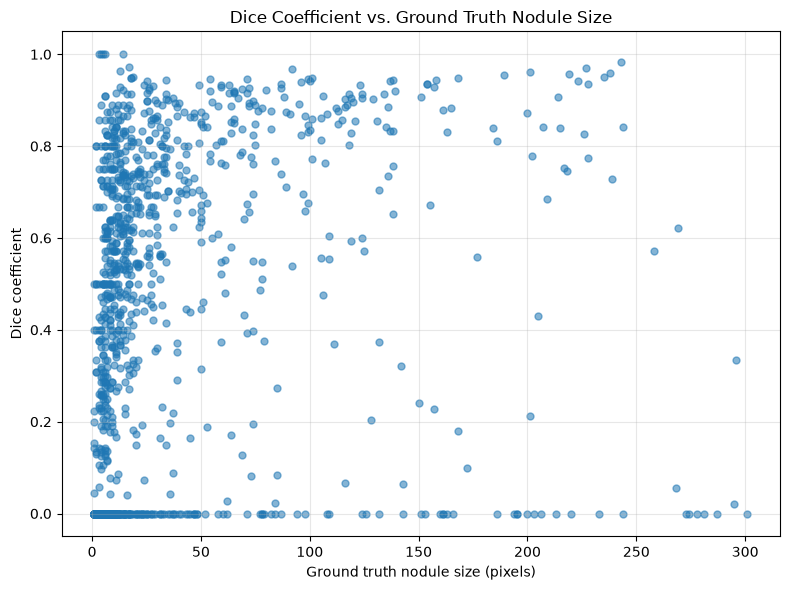

/Volumes/Expansion/PLOS_2D_UNet_Revision/figures/dice_vs_nodule_size.png


In [28]:
scatter_path = FIGURES_DIR / "dice_vs_nodule_size.png"

plt.figure(figsize=(8,6))

plt.scatter(
    positive_test_metrics_df["ground_truth_pixels"],
    positive_test_metrics_df["dice"],
    alpha=0.55,
    s=25
)

plt.xlabel("Ground truth nodule size (pixels)")
plt.ylabel("Dice coefficient")

plt.title("Dice Coefficient vs. Ground Truth Nodule Size")

plt.grid(alpha=0.3)

plt.tight_layout()

plt.savefig(
    scatter_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(scatter_path)


In [29]:
correlation = positive_test_metrics_df[
    ["ground_truth_pixels","dice"]
].corr(method="spearman").iloc[0,1]

print(f"Spearman correlation = {correlation:.3f}")


Spearman correlation = 0.433


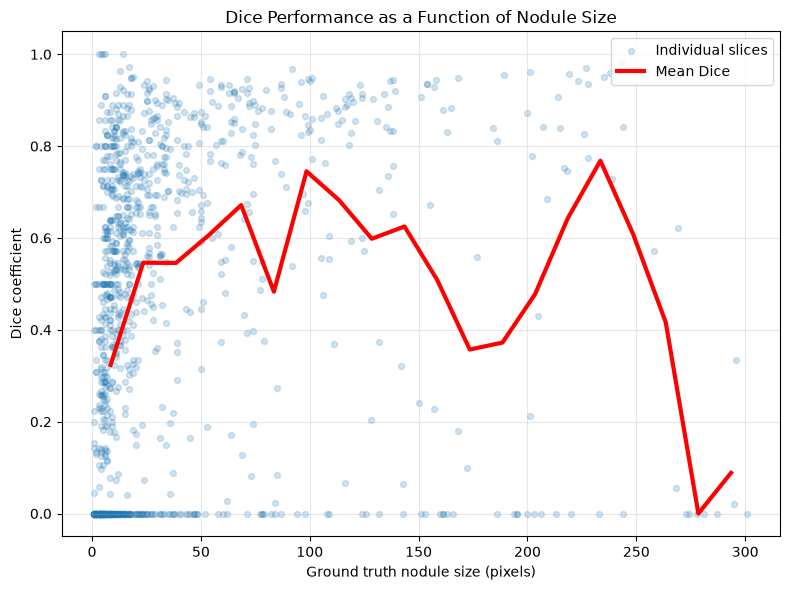

In [30]:
from scipy.stats import binned_statistic

x = positive_test_metrics_df["ground_truth_pixels"]
y = positive_test_metrics_df["dice"]

means, edges, _ = binned_statistic(
    x,
    y,
    statistic="mean",
    bins=20
)

centers = (edges[:-1] + edges[1:]) / 2

plt.figure(figsize=(8,6))

plt.scatter(
    x,
    y,
    alpha=0.20,
    s=18,
    label="Individual slices"
)

plt.plot(
    centers,
    means,
    color="red",
    linewidth=3,
    label="Mean Dice"
)

plt.xlabel("Ground truth nodule size (pixels)")
plt.ylabel("Dice coefficient")

plt.title("Dice Performance as a Function of Nodule Size")

plt.legend()

plt.grid(alpha=0.3)

plt.tight_layout()

plt.savefig(
    FIGURES_DIR/"dice_vs_size_trend.png",
    dpi=300
)

plt.show()


In [31]:
# ============================================================
# SECTION 20 — Dice versus nodule size using quantile bins
# ============================================================

from scipy.stats import spearmanr

size_dice_df = (
    positive_test_metrics_df[
        ["ground_truth_pixels", "dice"]
    ]
    .dropna()
    .copy()
)

# Spearman association
spearman_rho, spearman_p = spearmanr(
    size_dice_df["ground_truth_pixels"],
    size_dice_df["dice"],
)

# Quantile bins contain approximately equal numbers of slices
size_dice_df["size_bin"] = pd.qcut(
    size_dice_df["ground_truth_pixels"],
    q=10,
    duplicates="drop",
)

size_bin_summary = (
    size_dice_df
    .groupby(
        "size_bin",
        observed=True,
    )
    .agg(
        median_size=("ground_truth_pixels", "median"),
        mean_dice=("dice", "mean"),
        median_dice=("dice", "median"),
        std_dice=("dice", "std"),
        n_slices=("dice", "size"),
    )
    .reset_index()
)

size_bin_summary["standard_error"] = (
    size_bin_summary["std_dice"]
    /
    np.sqrt(size_bin_summary["n_slices"])
)

size_bin_summary


,size_bin,median_size,mean_dice,median_dice,std_dice,n_slices,standard_error
0,"(0.999, 4.0]",3.0,0.141523,0.000000,0.239879,160,0.018964
1,"(4.0, 6.0]",6.0,0.299102,0.260870,0.294129,110,0.028044
2,"(6.0, 8.0]",8.0,0.332602,0.333333,0.296671,105,0.028952
3,"(8.0, 11.0]",10.0,0.436828,0.510870,0.311556,108,0.029979
4,"(11.0, 15.0]",13.0,0.489395,0.551724,0.300482,113,0.028267
5,"(15.0, 20.0]",17.5,0.515119,0.576037,0.281748,94,0.029060
6,"(20.0, 31.0]",26.0,0.564302,0.654656,0.296895,112,0.028054
7,"(31.0, 55.0]",40.5,0.573070,0.701941,0.321539,112,0.030383
8,"(55.0, 108.9]",75.0,0.633606,0.780488,0.326577,113,0.030722
9,"(108.9, 301.0]",161.0,0.542642,0.734177,0.390590,115,0.036423


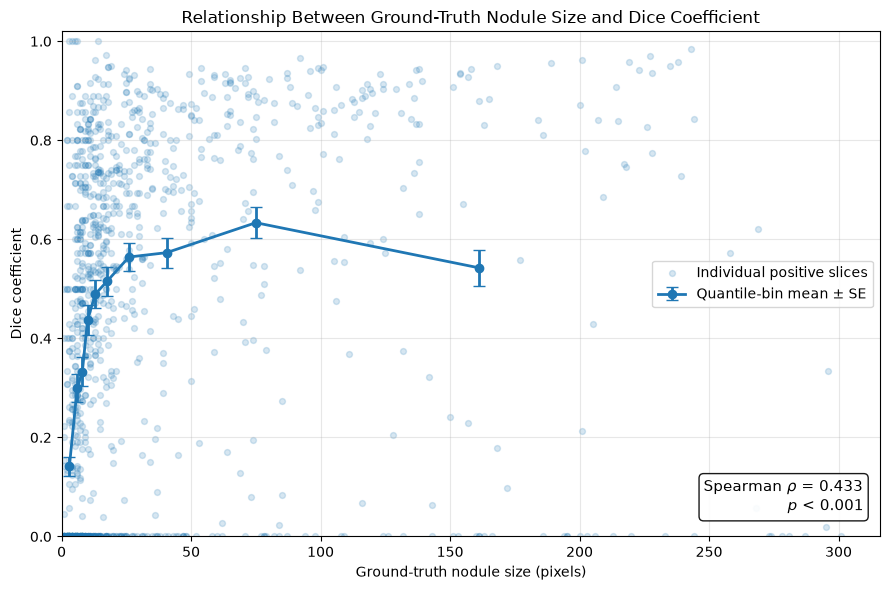

Spearman rho: 0.433328
Spearman p-value: 1.782052e-53
Saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/figures/dice_vs_nodule_size_quantile_bins.png


In [33]:
# ============================================================
# Publication figure — Dice versus nodule size
# ============================================================

plt.figure(figsize=(9, 6))

plt.scatter(
    size_dice_df["ground_truth_pixels"],
    size_dice_df["dice"],
    alpha=0.18,
    s=18,
    label="Individual positive slices",
)

plt.errorbar(
    size_bin_summary["median_size"],
    size_bin_summary["mean_dice"],
    yerr=size_bin_summary["standard_error"],
    marker="o",
    linewidth=2,
    capsize=4,
    label="Quantile-bin mean ± SE",
)

plt.xlabel("Ground-truth nodule size (pixels)")
plt.ylabel("Dice coefficient")

plt.title(
    "Relationship Between Ground-Truth Nodule Size and Dice Coefficient"
)


plt.text(
    0.98,
    0.04,
    f"Spearman $\\rho$ = {spearman_rho:.3f}\n"
    f"$p$ < 0.001",
    transform=plt.gca().transAxes,
    ha="right",
    va="bottom",
    fontsize=11,
    bbox=dict(
        facecolor="white",
        edgecolor="black",
        alpha=0.9,
        boxstyle="round"
    )
)

plt.xlim(left=0)
plt.ylim(0, 1.02)
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()

size_figure_path = (
    FIGURES_DIR /
    "dice_vs_nodule_size_quantile_bins.png"
)

plt.savefig(
    size_figure_path,
    dpi=300,
    bbox_inches="tight",
)

plt.show()

print("Spearman rho:", f"{spearman_rho:.6f}")
print("Spearman p-value:", f"{spearman_p:.6e}")
print("Saved to:")
print(size_figure_path)


In [34]:
missed_df = positive_test_metrics_df[
    positive_test_metrics_df["detected"] == False
].copy()

detected_df = positive_test_metrics_df[
    positive_test_metrics_df["detected"] == True
].copy()

print("Detected:", len(detected_df))
print("Missed:", len(missed_df))


Detected: 822
Missed: 320


{'whiskers': [<matplotlib.lines.Line2D at 0x122d25450>,
 'caps': [<matplotlib.lines.Line2D at 0x122b93490>,
 'boxes': [<matplotlib.lines.Line2D at 0x122d24d10>,
 'medians': [<matplotlib.lines.Line2D at 0x122ce9e50>,
 'fliers': [],
 'means': []}

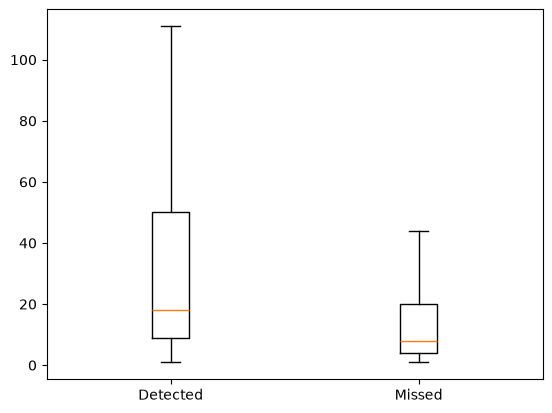

In [36]:
plt.boxplot(
    [
        detected_df["ground_truth_pixels"],
        missed_df["ground_truth_pixels"]
    ],
    tick_labels=[
        "Detected",
        "Missed"
    ],
    showfliers=False
)


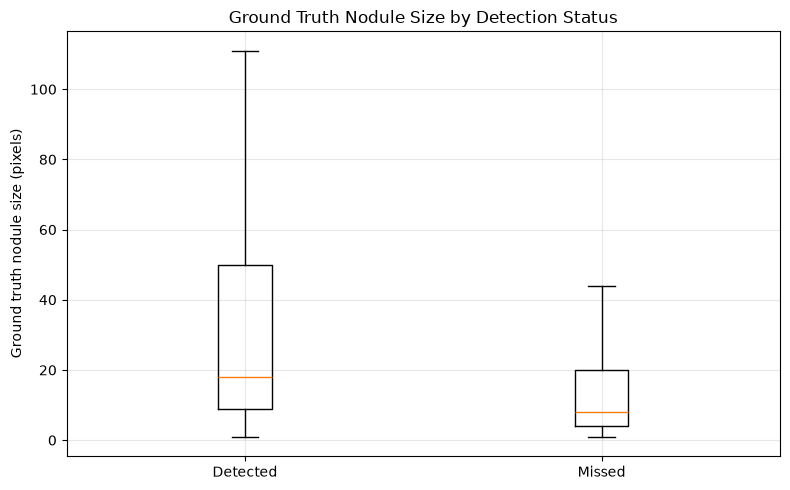

In [37]:
fig, ax = plt.subplots(figsize=(8,5))

ax.boxplot(
    [
        detected_df["ground_truth_pixels"],
        missed_df["ground_truth_pixels"]
    ],
    showfliers=False
)

ax.set_xticks([1, 2])
ax.set_xticklabels([
    "Detected",
    "Missed"
])

ax.set_ylabel("Ground truth nodule size (pixels)")
ax.set_title("Ground Truth Nodule Size by Detection Status")
ax.grid(alpha=0.3)

plt.tight_layout()

plt.savefig(
    FIGURES_DIR / "missed_vs_detected_boxplot.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()


In [38]:
from scipy.stats import mannwhitneyu

stat, p = mannwhitneyu(
    detected_df["ground_truth_pixels"],
    missed_df["ground_truth_pixels"],
    alternative="two-sided"
)

print("Median detected:",
      detected_df["ground_truth_pixels"].median())

print("Median missed:",
      missed_df["ground_truth_pixels"].median())

print("Mann-Whitney U p-value:",
      p)


Median detected: 18.0
Median missed: 8.0
Mann-Whitney U p-value: 3.305300329191184e-22


In [39]:
best_examples = (
    positive_test_metrics_df
    .sort_values("dice", ascending=False)
    .head(6)
)

median_examples = (
    positive_test_metrics_df.iloc[
        (
            positive_test_metrics_df["dice"]-
            positive_test_metrics_df["dice"].median()
        ).abs().argsort()[:6]
    ]
)

failure_examples = (
    positive_test_metrics_df[
        positive_test_metrics_df["dice"]==0
    ]
    .head(6)
)


In [40]:
# ============================================================
# Reusable visualization function
# ============================================================

def visualize_segmentation_examples(
    examples_df,
    title,
    model,
    processed_dir,
    threshold=OPTIMAL_THRESHOLD,
    save_name=None,
):
    """
    Visualize segmentation results for a list of slices.

    examples_df must contain:
        scan_id
        slice_index
        dice
        ground_truth_pixels
    """

    n = len(examples_df)

    fig, axes = plt.subplots(
        n,
        5,
        figsize=(18, 3.8 * n)
    )

    if n == 1:
        axes = np.expand_dims(axes, axis=0)

    for row_idx, (_, row) in enumerate(examples_df.iterrows()):

        scan_path = (
            processed_dir /
            f"LIDC_{int(row.scan_id):04d}.npz"
        )

        npz = np.load(scan_path)

        volume = npz["volume_normalized"]
        mask_volume = npz["consensus_mask"]

        slice_idx = int(row.slice_index)

        image = volume[slice_idx]
        mask = mask_volume[slice_idx]

        image_input = image[..., np.newaxis]

        prediction = model.predict(
            image_input[np.newaxis],
            verbose=0
        )[0]

        binary = prediction >= threshold

        ax = axes[row_idx]

        # --------------------------------------------------

        ax[0].imshow(image, cmap="gray")
        ax[0].set_title(
            f"Scan {int(row.scan_id)}\nSlice {slice_idx}"
        )

        # --------------------------------------------------

        ax[1].imshow(mask, cmap="gray")
        ax[1].set_title(
            f"GT\n{mask.sum():.0f} pixels"
        )

        # --------------------------------------------------

        im = ax[2].imshow(
            prediction[:, :, 0],
            cmap="viridis",
            vmin=0,
            vmax=1,
        )

        ax[2].set_title(
            f"Probability\nmax={prediction.max():.3f}"
        )

        plt.colorbar(
            im,
            ax=ax[2],
            fraction=0.046,
        )

        # --------------------------------------------------

        ax[3].imshow(binary[:, :, 0], cmap="gray")

        ax[3].set_title(
            f"Prediction ≥ {threshold:.2f}\n"
            f"{binary.sum()} pixels"
        )

        # --------------------------------------------------

        ax[4].imshow(image, cmap="gray")

        ax[4].imshow(
            mask,
            cmap="Greens",
            alpha=0.35,
        )

        ax[4].imshow(
            binary[:, :, 0],
            cmap="Reds",
            alpha=0.45,
        )

        ax[4].set_title(
            f"Dice={row.dice:.3f}"
        )

        # --------------------------------------------------

        for a in ax:
            a.axis("off")

    plt.suptitle(
        title,
        fontsize=16,
        fontweight="bold"
    )

    plt.tight_layout()

    if save_name is not None:

        plt.savefig(
            FIGURES_DIR / save_name,
            dpi=300,
            bbox_inches="tight",
        )

    plt.show()


In [42]:
# ============================================================
# Attach test-slice metadata to per-slice evaluation results
# ============================================================

# Use this directly if test_df is already available:
# positive_test_metadata_df = (
#     test_df[test_df["is_positive"]]
#     .reset_index(drop=True)
#     .copy()
# )

# Otherwise locate the saved slice-level CSV automatically.
required_metadata_columns = {
    "scan_id",
    "split",
    "npz_path",
    "slice_index",
    "is_positive",
    "mask_pixels",
}

metadata_candidates = []

metadata_search_dir = METADATA_DIR / f"seed{RUN_SEED}"

for csv_path in metadata_search_dir.glob("*.csv"):
    try:
        columns = set(
            pd.read_csv(csv_path, nrows=2).columns
        )

        if required_metadata_columns.issubset(columns):
            metadata_candidates.append(csv_path)

    except Exception:
        continue

print("Compatible metadata files:")
for path in metadata_candidates:
    print("-", path.name)

if not metadata_candidates:
    raise FileNotFoundError(
        "No metadata CSV contains all required columns: "
        f"{sorted(required_metadata_columns)}"
    )

# Select the appropriate slice-level metadata file.
# If several files appear, replace [0] with the correct one.
SLICE_METADATA_PATH = metadata_candidates[0]

slice_metadata_df = pd.read_csv(
    SLICE_METADATA_PATH
)

positive_test_metadata_df = (
    slice_metadata_df.loc[
        (slice_metadata_df["split"] == "test")
        & (slice_metadata_df["is_positive"].astype(bool))
    ]
    .reset_index(drop=True)
    .copy()
)

print("Evaluation rows:", len(positive_test_metrics_df))
print("Metadata rows:", len(positive_test_metadata_df))

assert len(positive_test_metadata_df) == len(
    positive_test_metrics_df
), (
    "The positive-test metadata order/count does not match "
    "the evaluation results."
)


Compatible metadata files:
- slice_level_index_seed42.csv
Evaluation rows: 1142
Metadata rows: 1142


In [43]:
# Preserve the evaluation row index separately
metrics_for_merge = (
    positive_test_metrics_df
    .rename(
        columns={
            "slice_index": "evaluation_index"
        }
    )
    .reset_index(drop=True)
)

metadata_for_merge = (
    positive_test_metadata_df[
        [
            "scan_id",
            "npz_path",
            "slice_index",
            "mask_pixels",
        ]
    ]
    .reset_index(drop=True)
)

positive_test_results_df = pd.concat(
    [
        metadata_for_merge,
        metrics_for_merge,
    ],
    axis=1,
)

print(positive_test_results_df.columns.tolist())
positive_test_results_df.head()


['scan_id', 'npz_path', 'slice_index', 'mask_pixels', 'dice', 'iou', 'precision', 'recall', 'specificity', 'ground_truth_pixels', 'predicted_pixels', 'true_positive_pixels', 'false_positive_pixels', 'false_negative_pixels', 'detected', 'evaluation_index', 'threshold']


,scan_id,npz_path,slice_index,mask_pixels,dice,iou,precision,recall,specificity,ground_truth_pixels,predicted_pixels,true_positive_pixels,false_positive_pixels,false_negative_pixels,detected,evaluation_index,threshold
0,21,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,67,2,0.0,0.00,0.0,0.00,1.0,2,0,0,0,2,False,0,0.05
1,21,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,68,4,0.4,0.25,1.0,0.25,1.0,4,1,1,0,3,True,1,0.05
2,21,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,69,2,0.0,0.00,0.0,0.00,1.0,2,0,0,0,2,False,2,0.05
3,21,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,70,1,0.0,0.00,0.0,0.00,1.0,1,0,0,0,1,False,3,0.05
4,21,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,92,1,0.0,0.00,0.0,0.00,1.0,1,0,0,0,1,False,4,0.05


In [44]:
# ============================================================
# Best, representative, and failure examples
# ============================================================

best_examples = (
    positive_test_results_df
    .sort_values(
        "dice",
        ascending=False,
    )
    .head(6)
    .copy()
)

median_dice_value = (
    positive_test_results_df["dice"].median()
)

median_examples = (
    positive_test_results_df
    .assign(
        distance_from_median=lambda df: (
            df["dice"] - median_dice_value
        ).abs()
    )
    .sort_values("distance_from_median")
    .head(6)
    .drop(columns="distance_from_median")
    .copy()
)

failure_examples = (
    positive_test_results_df.loc[
        positive_test_results_df["dice"] == 0
    ]
    # Prefer failures with reasonably visible lesions
    .sort_values(
        "ground_truth_pixels",
        ascending=False,
    )
    .head(6)
    .copy()
)

print("Best examples:", len(best_examples))
print("Median examples:", len(median_examples))
print("Failure examples:", len(failure_examples))


Best examples: 6
Median examples: 6
Failure examples: 6


In [45]:
# ============================================================
# Reusable qualitative visualization function
# ============================================================

def visualize_segmentation_examples(
    examples_df,
    title,
    model,
    threshold,
    save_name=None,
):
    """
    Plot CT, ground truth, probability map, binary prediction,
    and contour overlay for selected positive test slices.

    Required columns:
        npz_path
        scan_id
        slice_index
        dice
        ground_truth_pixels
    """

    required_columns = {
        "npz_path",
        "scan_id",
        "slice_index",
        "dice",
        "ground_truth_pixels",
    }

    missing = required_columns - set(
        examples_df.columns
    )

    if missing:
        raise ValueError(
            f"Missing visualization columns: {sorted(missing)}"
        )

    n_examples = len(examples_df)

    if n_examples == 0:
        raise ValueError("examples_df is empty.")

    fig, axes = plt.subplots(
        n_examples,
        5,
        figsize=(18, 3.6 * n_examples),
        squeeze=False,
    )

    for plot_row, (_, row) in enumerate(
        examples_df.iterrows()
    ):
        npz_path = Path(row["npz_path"])
        ct_slice_index = int(row["slice_index"])

        if not npz_path.exists():
            raise FileNotFoundError(
                f"NPZ file not found: {npz_path}"
            )

        with np.load(npz_path) as npz:
            volume = npz[
                "volume_normalized"
            ]
            mask_volume = npz[
                "consensus_mask"
            ]

            # Volumes are height × width × slices
            image = volume[
                :, :, ct_slice_index
            ].astype(np.float32)

            ground_truth = mask_volume[
                :, :, ct_slice_index
            ].astype(np.uint8)

        if image.shape != (256, 256):
            raise ValueError(
                f"Unexpected CT shape {image.shape} "
                f"for {npz_path.name}, slice {ct_slice_index}"
            )

        if ground_truth.shape != (256, 256):
            raise ValueError(
                f"Unexpected mask shape {ground_truth.shape} "
                f"for {npz_path.name}, slice {ct_slice_index}"
            )

        model_input = image[
            np.newaxis,
            ...,
            np.newaxis,
        ]

        probability = model.predict(
            model_input,
            verbose=0,
        )[0, :, :, 0]

        binary_prediction = (
            probability >= threshold
        ).astype(np.uint8)

        axes[plot_row, 0].imshow(
            image,
            cmap="gray",
        )
        axes[plot_row, 0].set_title(
            f"CT\nScan {row['scan_id']}, "
            f"slice {ct_slice_index}"
        )

        axes[plot_row, 1].imshow(
            ground_truth,
            cmap="gray",
            vmin=0,
            vmax=1,
        )
        axes[plot_row, 1].set_title(
            f"Ground truth\n"
            f"{int(ground_truth.sum())} pixels"
        )

        probability_image = axes[
            plot_row,
            2
        ].imshow(
            probability,
            cmap="viridis",
            vmin=0,
            vmax=1,
        )
        axes[plot_row, 2].set_title(
            f"Probability\n"
            f"max={probability.max():.3f}"
        )

        fig.colorbar(
            probability_image,
            ax=axes[plot_row, 2],
            fraction=0.046,
            pad=0.04,
        )

        axes[plot_row, 3].imshow(
            binary_prediction,
            cmap="gray",
            vmin=0,
            vmax=1,
        )
        axes[plot_row, 3].set_title(
            f"Prediction ≥ {threshold:.2f}\n"
            f"{int(binary_prediction.sum())} pixels"
        )

        axes[plot_row, 4].imshow(
            image,
            cmap="gray",
        )

        if ground_truth.any():
            axes[plot_row, 4].contour(
                ground_truth,
                levels=[0.5],
                colors="lime",
                linewidths=1.5,
            )

        if binary_prediction.any():
            axes[plot_row, 4].contour(
                binary_prediction,
                levels=[0.5],
                colors="red",
                linewidths=1.5,
            )

        axes[plot_row, 4].set_title(
            "GT green / Prediction red\n"
            f"Dice={float(row['dice']):.3f}"
        )

        for axis in axes[plot_row]:
            axis.axis("off")

    fig.suptitle(
        title,
        fontsize=16,
        fontweight="bold",
        y=1.002,
    )

    plt.tight_layout()

    if save_name is not None:
        figure_path = (
            FIGURES_DIR / save_name
        )

        plt.savefig(
            figure_path,
            dpi=300,
            bbox_inches="tight",
        )

        print("Saved to:")
        print(figure_path)

    plt.show()


Saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/figures/figure7_best_examples.png


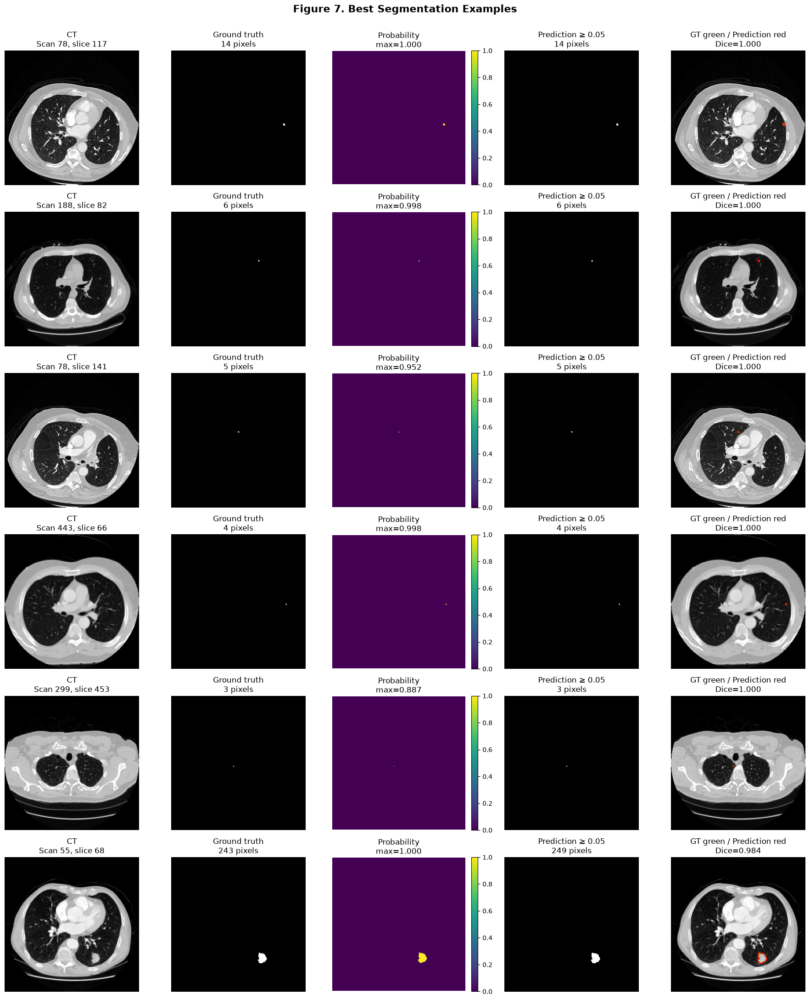

In [46]:
visualize_segmentation_examples(
    best_examples,
    title="Figure 7. Best Segmentation Examples",
    model=best_model_v2,
    threshold=OPTIMAL_THRESHOLD,
    save_name="figure7_best_examples.png",
)


Saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/figures/figure8_representative_examples.png


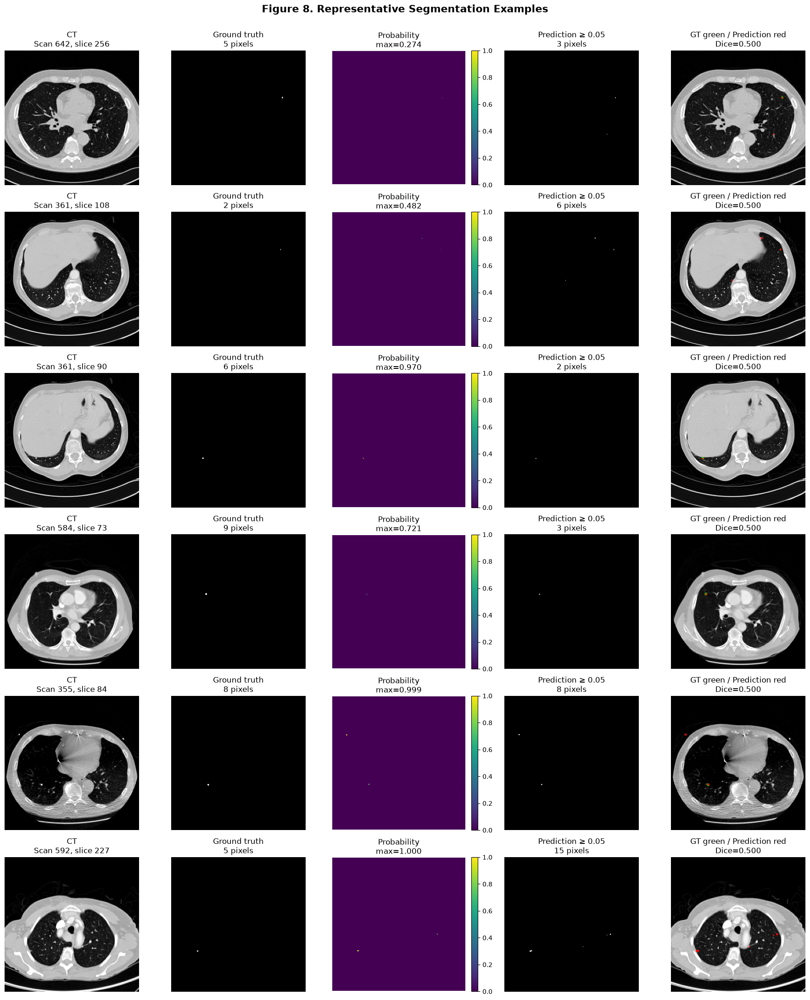

In [49]:
visualize_segmentation_examples(
    median_examples,
    title="Figure 8. Representative Segmentation Examples",
    model=best_model_v2,
    threshold=OPTIMAL_THRESHOLD,
    save_name="figure8_representative_examples.png",
)


Saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/figures/figure9_failure_examples.png


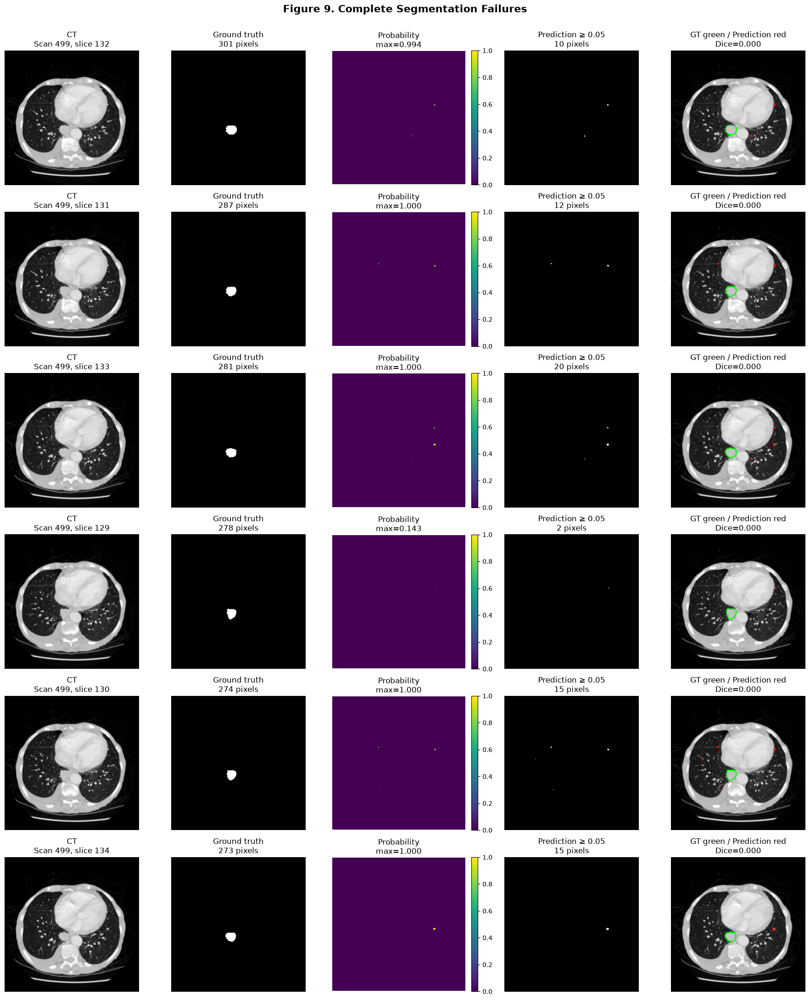

In [48]:
visualize_segmentation_examples(
    failure_examples,
    title="Figure 9. Complete Segmentation Failures",
    model=best_model_v2,
    threshold=OPTIMAL_THRESHOLD,
    save_name="figure9_failure_examples.png",
)


Saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/figures/figure8_representative_examples.png


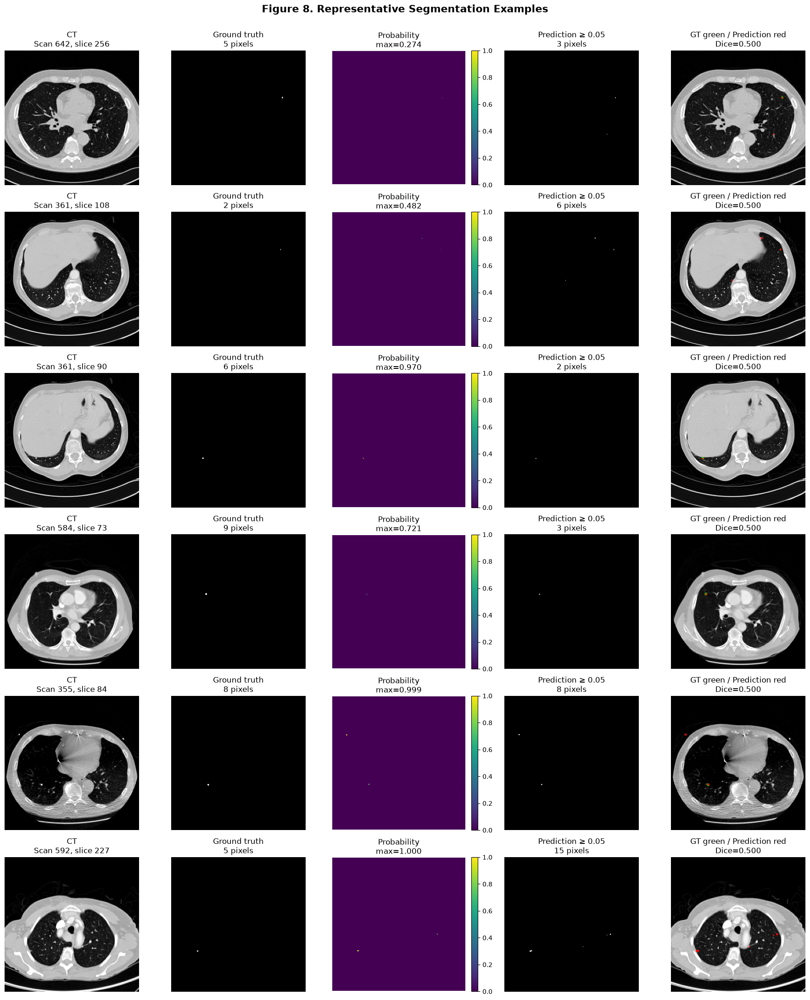

In [50]:
visualize_segmentation_examples(
    median_examples,
    title="Figure 8. Representative Segmentation Examples",
    model=best_model_v2,
    threshold=OPTIMAL_THRESHOLD,
    save_name="figure8_representative_examples.png",
)


Exists: True
Path: /Volumes/Expansion/PLOS_2D_UNet_Revision/figures/figure8_representative_examples.png


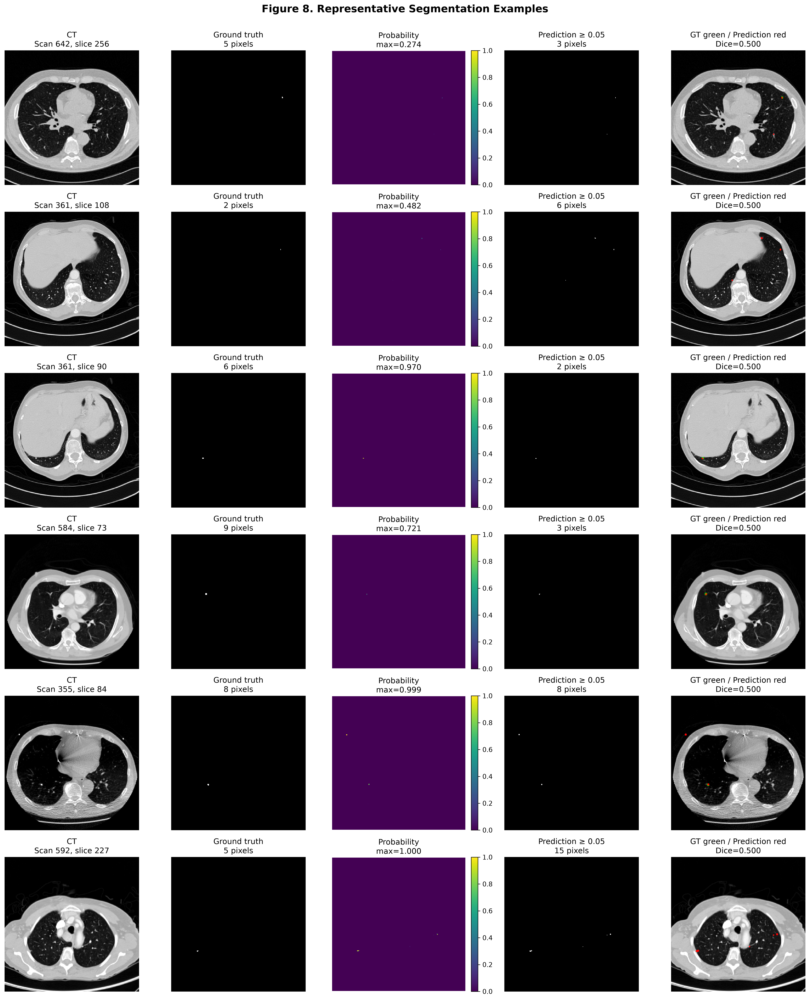

In [51]:
from PIL import Image
from IPython.display import display

figure8_path = (
    FIGURES_DIR /
    "figure8_representative_examples.png"
)

print("Exists:", figure8_path.exists())
print("Path:", figure8_path)

display(Image.open(figure8_path))


In [52]:
# ============================================================
# SECTION 27 — Pixel-level confusion matrix
# ============================================================

IMAGE_HEIGHT = 256
IMAGE_WIDTH = 256
PIXELS_PER_SLICE = IMAGE_HEIGHT * IMAGE_WIDTH

TP = int(
    positive_test_metrics_df["true_positive_pixels"].sum()
)

FP = int(
    positive_test_metrics_df["false_positive_pixels"].sum()
)

FN = int(
    positive_test_metrics_df["false_negative_pixels"].sum()
)

total_pixels = (
    len(positive_test_metrics_df)
    * PIXELS_PER_SLICE
)

TN = int(
    total_pixels - TP - FP - FN
)

confusion_matrix_pixels = np.array(
    [
        [TN, FP],
        [FN, TP],
    ]
)

print("True negatives:", f"{TN:,}")
print("False positives:", f"{FP:,}")
print("False negatives:", f"{FN:,}")
print("True positives:", f"{TP:,}")
print("Total pixels:", f"{total_pixels:,}")

assert confusion_matrix_pixels.sum() == total_pixels


True negatives: 74,783,985
False positives: 15,526
False negatives: 18,654
True positives: 23,947
Total pixels: 74,842,112


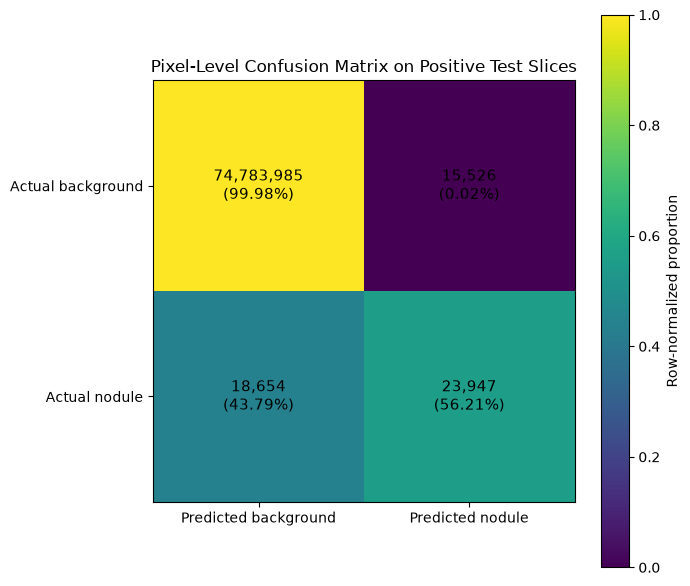

Saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/figures/pixel_level_confusion_matrix.png


In [53]:
# ============================================================
# Pixel-level confusion matrix figure
# ============================================================

row_totals = confusion_matrix_pixels.sum(
    axis=1,
    keepdims=True,
)

confusion_matrix_normalized = (
    confusion_matrix_pixels / row_totals
)

fig, ax = plt.subplots(figsize=(7, 6))

image_plot = ax.imshow(
    confusion_matrix_normalized,
    vmin=0,
    vmax=1,
)

ax.set_xticks([0, 1])
ax.set_xticklabels(
    ["Predicted background", "Predicted nodule"]
)

ax.set_yticks([0, 1])
ax.set_yticklabels(
    ["Actual background", "Actual nodule"]
)

for row_index in range(2):
    for column_index in range(2):

        count = confusion_matrix_pixels[
            row_index,
            column_index,
        ]

        percentage = (
            confusion_matrix_normalized[
                row_index,
                column_index,
            ]
        )

        ax.text(
            column_index,
            row_index,
            f"{count:,}\n({percentage:.2%})",
            ha="center",
            va="center",
            fontsize=11,
        )

ax.set_title(
    "Pixel-Level Confusion Matrix on Positive Test Slices"
)

fig.colorbar(
    image_plot,
    ax=ax,
    label="Row-normalized proportion",
)

plt.tight_layout()

confusion_matrix_path = (
    FIGURES_DIR /
    "pixel_level_confusion_matrix.png"
)

plt.savefig(
    confusion_matrix_path,
    dpi=300,
    bbox_inches="tight",
)

plt.show()

print("Saved to:")
print(confusion_matrix_path)


In [54]:
# ============================================================
# Global pixel-level metrics
# ============================================================

EPSILON = 1e-7

global_dice = (
    2 * TP
    /
    (2 * TP + FP + FN + EPSILON)
)

global_iou = (
    TP
    /
    (TP + FP + FN + EPSILON)
)

global_precision = (
    TP
    /
    (TP + FP + EPSILON)
)

global_recall = (
    TP
    /
    (TP + FN + EPSILON)
)

global_specificity = (
    TN
    /
    (TN + FP + EPSILON)
)

global_accuracy = (
    TP + TN
) / (
    TP + TN + FP + FN + EPSILON
)

global_pixel_metrics = {
    "global_dice": global_dice,
    "global_iou": global_iou,
    "global_precision": global_precision,
    "global_recall": global_recall,
    "global_specificity": global_specificity,
    "global_accuracy": global_accuracy,
}

print("=== GLOBAL PIXEL-LEVEL METRICS ===")

for metric_name, metric_value in (
    global_pixel_metrics.items()
):
    print(
        f"{metric_name}: {metric_value:.6f}"
    )


=== GLOBAL PIXEL-LEVEL METRICS ===
global_dice: 0.583547
global_iou: 0.411977
global_precision: 0.606668
global_recall: 0.562123
global_specificity: 0.999792
global_accuracy: 0.999543


In [55]:
# ============================================================
# SECTION 28 — Final performance summary table
# ============================================================

final_performance_table = pd.DataFrame(
    {
        "Metric": [
            "Selected threshold",
            "Positive test slices",
            "Detected slices",
            "Slice detection rate",
            "Mean per-slice Dice",
            "Median per-slice Dice",
            "Mean per-slice IoU",
            "Mean per-slice precision",
            "Mean per-slice recall",
            "Mean per-slice specificity",
            "Global pixel Dice",
            "Global pixel IoU",
            "Global pixel precision",
            "Global pixel recall",
            "Global pixel specificity",
            "Global pixel accuracy",
        ],
        "Value": [
            float(final_summary["threshold"]),
            int(final_summary["n_positive_test_slices"]),
            int(final_summary["detected_slices"]),
            float(final_summary["detection_rate"]),
            float(final_summary["mean_dice"]),
            float(final_summary["median_dice"]),
            float(final_summary["mean_iou"]),
            float(final_summary["mean_precision"]),
            float(final_summary["mean_recall"]),
            float(final_summary["mean_specificity"]),
            global_dice,
            global_iou,
            global_precision,
            global_recall,
            global_specificity,
            global_accuracy,
        ],
    }
)

final_performance_table["Formatted value"] = (
    final_performance_table.apply(
        lambda row: (
            f"{int(row['Value']):,}"
            if row["Metric"] in {
                "Positive test slices",
                "Detected slices",
            }
            else f"{row['Value']:.4f}"
        ),
        axis=1,
    )
)

display(
    final_performance_table[
        ["Metric", "Formatted value"]
    ]
)


,Metric,Formatted value
0,Selected threshold,0.0500
1,Positive test slices,"1,142"
2,Detected slices,822
3,Slice detection rate,0.7198
4,Mean per-slice Dice,0.4402
5,Median per-slice Dice,0.5000
6,Mean per-slice IoU,0.3474
7,Mean per-slice precision,0.4338
8,Mean per-slice recall,0.5470
9,Mean per-slice specificity,0.9998


In [56]:
final_table_path = (
    RESULTS_DIR /
    "table_final_unet_test_performance.csv"
)

final_performance_table.to_csv(
    final_table_path,
    index=False,
)

print("Saved to:")
print(final_table_path)


Saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/results/table_final_unet_test_performance.csv
